In [68]:
import os
import random
import cv2
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from skimage import io
from shutil import copyfile
import sys
import time
import skimage
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [69]:
print(skimage.__version__)

0.20.0


In [70]:
#import wget
#url = 'https://storage.googleapis.com/openimages/2018_04/train/train-annotations-bbox.csv'
#filename = wget.download(url)

In [71]:
#import wget
#url = 'https://storage.googleapis.com/openimages/2018_04/train/train-images-boxable-with-rotation.csv'
#filename = wget.download(url)

In [72]:
#import wget
#url = 'https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv'
#class_description = wget.download(url)

In [73]:
images_boxable_file = 'train-images-boxable-with-rotation.csv'
annotations_bbox_file = 'train-annotations-bbox.csv'
class_descriptions_file = 'class-descriptions-boxable.csv'

In [74]:
images_boxable = pd.read_csv(images_boxable_file)
images_boxable.head()

,ImageID,Subset,OriginalURL,OriginalLandingURL,License,AuthorProfileURL,Author,Title,OriginalSize,OriginalMD5,Thumbnail300KURL,Rotation
0,4fa8054781a4c382,train,https://farm3.staticflickr.com/5310/5898076654...,https://www.flickr.com/photos/michael-beat/589...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/michael-beat/,Michael Beat,...die FNF-Kerze,4405052,KFukvivpCM5QXl5SqKe41g==,https://c1.staticflickr.com/6/5310/5898076654_...,0.0
1,b37f763ae67d0888,train,https://c1.staticflickr.com/1/67/197493648_628...,https://www.flickr.com/photos/drstarbuck/19749...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/drstarbuck/,Karen,Three boys on a hill,494555,9IzEn38GRNsVpATuv7gzEA==,https://c3.staticflickr.com/1/67/197493648_628...,0.0
2,7e8584b0f487cb9e,train,https://c7.staticflickr.com/8/7056/7143870979_...,https://www.flickr.com/photos/circasassy/71438...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/circasassy/,CircaSassy,A Christmas carol and The cricket on the heart...,2371584,3hQwu0iSzY1VIoXiwp0/Mg==,https://c7.staticflickr.com/8/7056/7143870979_...,0.0
3,86638230febe21c4,train,https://farm5.staticflickr.com/5128/5301868579...,https://www.flickr.com/photos/ajcreencia/53018...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/ajcreencia/,Alex,Abbey and Kenny,949267,onB+rCZnGQg5PRX7xOs18Q==,https://c4.staticflickr.com/6/5128/5301868579_...,NaN
4,249086e72671397d,train,https://c6.staticflickr.com/4/3930/15342460029...,https://www.flickr.com/photos/codnewsroom/1534...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/codnewsroom/,COD Newsroom,Suburban Law Enforcement Academy 20th Annivers...,6541758,MjpaAVbMAWbCusSaxI1D7w==,https://c1.staticflickr.com/4/3930/15342460029...,0.0


In [75]:
annotations_bbox = pd.read_csv(annotations_bbox_file)
annotations_bbox.head()

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside
0,000002b66c9c498e,xclick,/m/01g317,1,0.012500,0.195312,0.148438,0.587500,0,1,0,0,0
1,000002b66c9c498e,xclick,/m/01g317,1,0.025000,0.276563,0.714063,0.948438,0,1,0,0,0
2,000002b66c9c498e,xclick,/m/01g317,1,0.151562,0.310937,0.198437,0.590625,1,0,0,0,0
3,000002b66c9c498e,xclick,/m/01g317,1,0.256250,0.429688,0.651563,0.925000,1,0,0,0,0
4,000002b66c9c498e,xclick,/m/01g317,1,0.257812,0.346875,0.235938,0.385938,1,0,0,0,0


In [76]:
class_descriptions = pd.read_csv(class_descriptions_file, header=None)
class_descriptions.head()

,0,1
0,/m/011k07,Tortoise
1,/m/011q46kg,Container
2,/m/012074,Magpie
3,/m/0120dh,Sea turtle
4,/m/01226z,Football


In [77]:
annotations_bbox["ImageID"].value_counts().tail(50).index.values

array(['7a21927e3d1b7502', '7a21e50c51508a3a', '7a2420cf90bda2ff',
       'cecc4f01e1966030', 'cecc3e329eafed7e', '15790265843c89f6',
       '7a24e1b87f6362e4', 'cecc2a856f665606', '7a24fe3a79454c9f',
       '1578efa768de857e', '7a254d36b2951a3e', '7a257749c84458d7',
       '7a259973a03f3af0', '1578db09d4961d47', 'cecb82d4b55ecded',
       '7a263d039e0ca0aa', '7a2648a6bc306f03', '7a268614c3d92ae5',
       '7a2691f13d4428f0', '7a26978cb92e0d04', 'cecb4fa2a2bbb9b8',
       'cecb4e96d967ecd0', '0516f71f618e0087', '7a279a7810fdb6af',
       '7a242e8b420344a2', '7a23bf23c0749c5a', 'cecde889a8f0a1b5',
       'cecc72ea163f7732', '7a22011f53305064', '7a221b7299bfb572',
       'cecdca6df9dfb79b', '0516a66cba8401b2', '7a229fec0c172c43',
       'cecd7a14f0bc0c6b', '7a22c1fb22c62eeb', '7a22c40d87d13f74',
       'cecd655c211d9bde', '7a22d93067535f64', '7a22f8cc63b8ef9f',
       'cecd40d1fd2fe74e', '0516b45abb07783b', '0516b83e6ca56225',
       '7a236976d301e4e4', '7a236f7c28b4dd81', 'ceccfff9025ddd

In [78]:
# Code for plotting bounding box
def plot_bbox(img_id):
    img_url = images_boxable.loc[images_boxable["ImageID"]==img_id]['OriginalURL'].values[0]
    img = io.imread(img_url)
    height, width, channel = img.shape
    print(f"Image: {img.shape}")
    bboxs = annotations_bbox[annotations_bbox['ImageID']==img_id]
    for index, row in bboxs.iterrows():
        xmin = row['XMin']
        xmax = row['XMax']
        ymin = row['YMin']
        ymax = row['YMax']
        xmin = int(xmin*width)
        xmax = int(xmax*width)
        ymin = int(ymin*height)
        ymax = int(ymax*height)
        label_name = row['LabelName']
        class_series = class_descriptions[class_descriptions[0]==label_name]
        class_name = class_series[1].values[0]
        print(f"Coordinates: {xmin,ymin}, {xmax,ymax}")
        cv2.rectangle(img, (xmin,ymin), (xmax,ymax), (255,0,0), 5)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(img, class_name, (xmin,ymin-10), font, 3, (0,255,0), 5)
    plt.figure(figsize=(15,10))
    plt.title('Image with Bounding Box')
    plt.imshow(img)
    plt.axis("off")
    plt.show()

['7a21927e3d1b7502' '7a21e50c51508a3a' '7a2420cf90bda2ff'
 'cecc4f01e1966030' 'cecc3e329eafed7e' '15790265843c89f6'
 '7a24e1b87f6362e4' 'cecc2a856f665606' '7a24fe3a79454c9f'
 '1578efa768de857e' '7a254d36b2951a3e' '7a257749c84458d7'
 '7a259973a03f3af0' '1578db09d4961d47' 'cecb82d4b55ecded'
 '7a263d039e0ca0aa' '7a2648a6bc306f03' '7a268614c3d92ae5'
 '7a2691f13d4428f0' '7a26978cb92e0d04' 'cecb4fa2a2bbb9b8'
 'cecb4e96d967ecd0' '0516f71f618e0087' '7a279a7810fdb6af'
 '7a242e8b420344a2' '7a23bf23c0749c5a' 'cecde889a8f0a1b5'
 'cecc72ea163f7732' '7a22011f53305064' '7a221b7299bfb572'
 'cecdca6df9dfb79b' '0516a66cba8401b2' '7a229fec0c172c43'
 'cecd7a14f0bc0c6b' '7a22c1fb22c62eeb' '7a22c40d87d13f74'
 'cecd655c211d9bde' '7a22d93067535f64' '7a22f8cc63b8ef9f'
 'cecd40d1fd2fe74e' '0516b45abb07783b' '0516b83e6ca56225'
 '7a236976d301e4e4' '7a236f7c28b4dd81' 'ceccfff9025dddde'
 'cecce707ee8e3f47' '0516b96f324d3185' 'cecca3fd43dfd625'
 '7a23b9b5804069aa' '9176fdcdbc7933bd']
Image: (2786, 4186, 3)
Coordinat

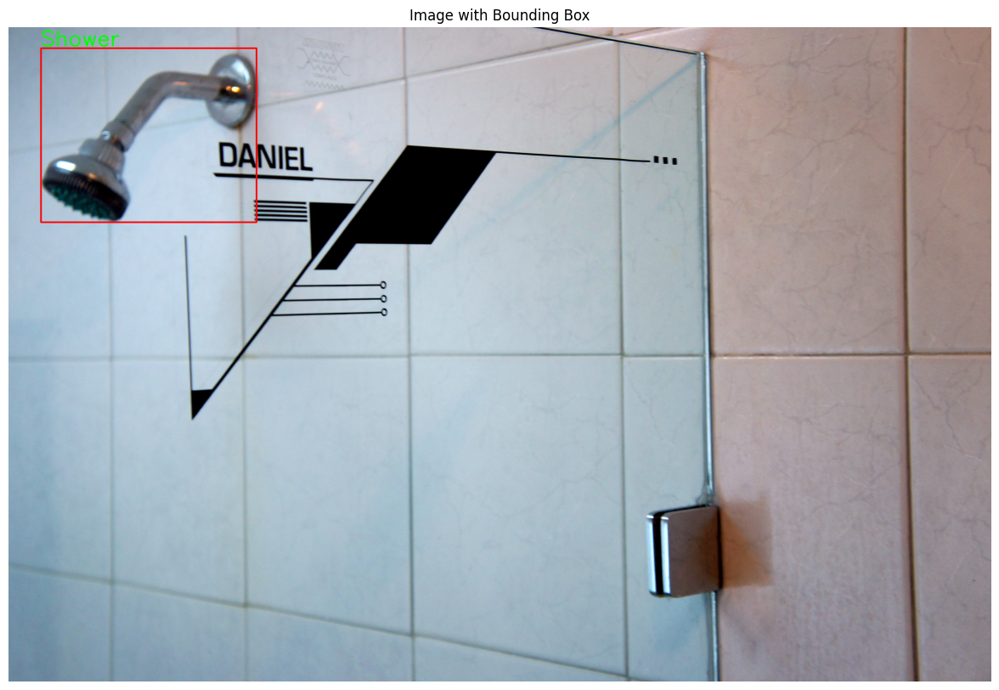

Image: (2298, 3064, 3)
Coordinates: (109, 241), (3064, 2298)


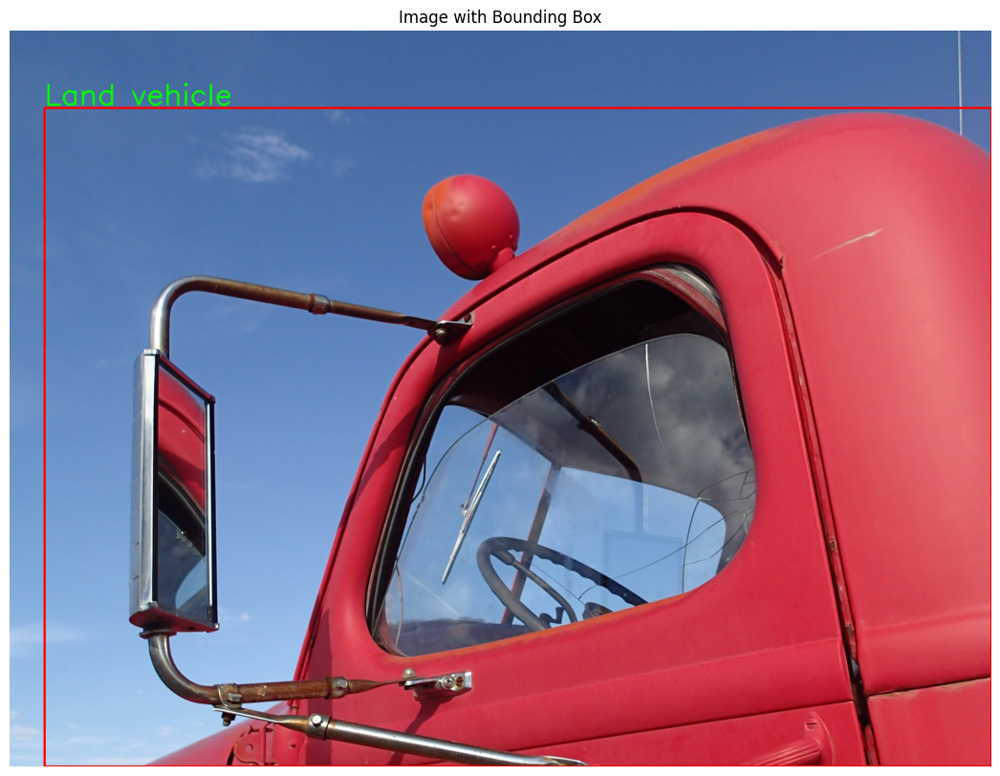

Image: (1067, 1600, 3)
Coordinates: (1260, 110), (1590, 423)


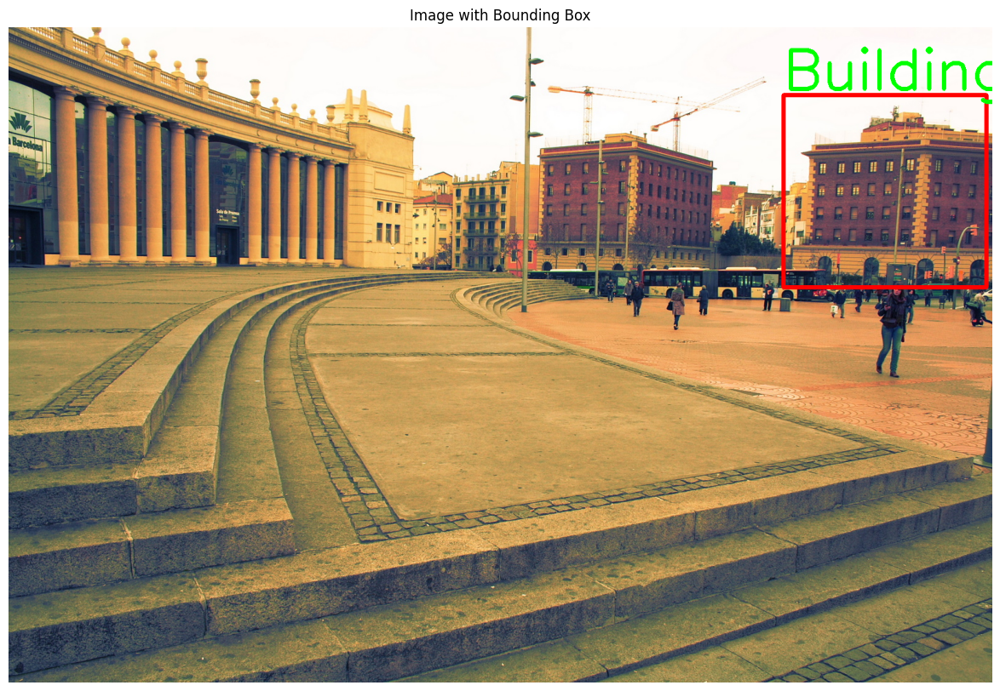

Image: (1536, 2048, 3)
Coordinates: (252, 0), (2046, 1534)


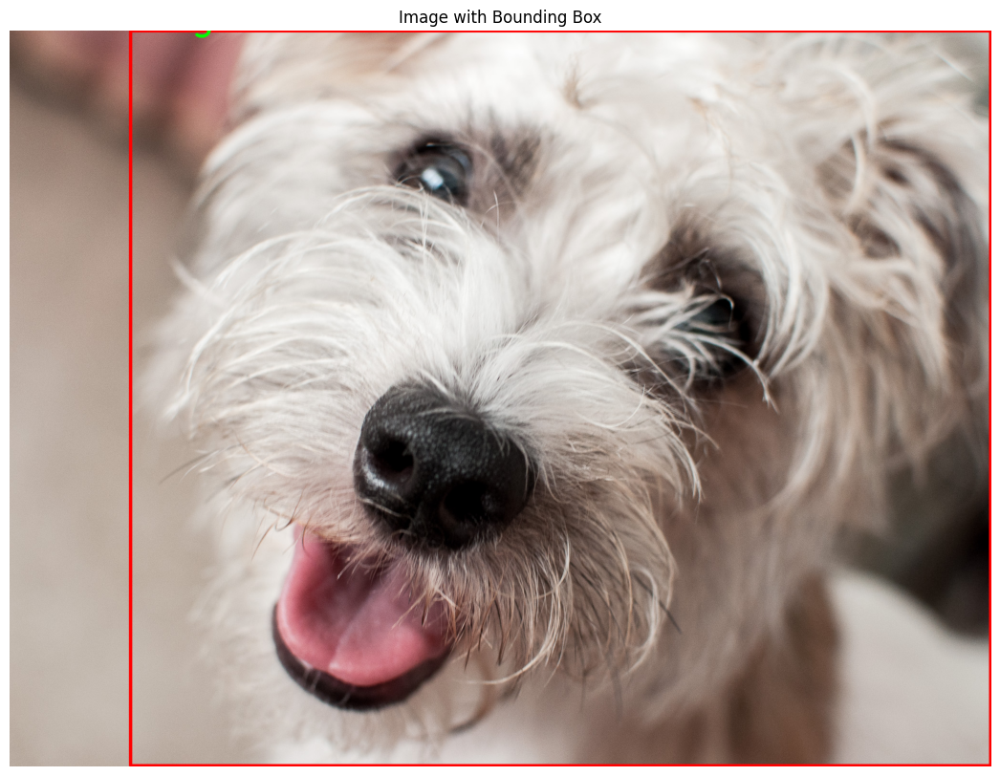

Image: (3264, 2448, 3)
Coordinates: (0, 0), (2445, 1487)


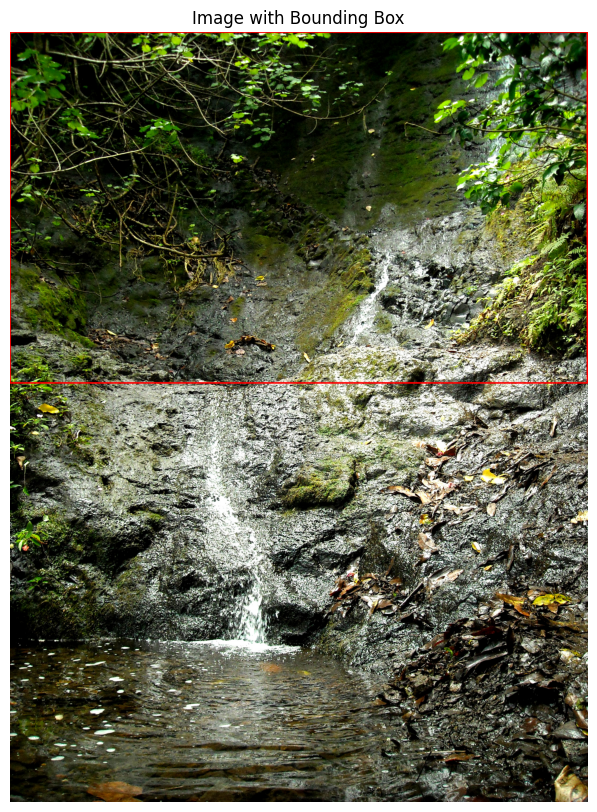

In [79]:
least_objects_img_ids = annotations_bbox["ImageID"].value_counts().tail(50).index.values
print(least_objects_img_ids);

for img_id in random.sample(list(least_objects_img_ids), 5):
    plot_bbox(img_id)

In [80]:
class_descriptions[1].count()

601

In [81]:
# Find the label_name for 'Bed', 'Chair' and 'Table' classes
bed_pd = class_descriptions[class_descriptions[1]=='Bed']
chair_pd = class_descriptions[class_descriptions[1]=='Chair']
table_pd = class_descriptions[class_descriptions[1]=='Table']

In [82]:
print("Label name of Bad chair and Table class")
print(bed_pd)
print(chair_pd)
print(table_pd)

Label name of Bad chair and Table class
             0    1
257  /m/03ssj5  Bed
            0      1
96  /m/01mzpv  Chair
             0      1
280  /m/04bcr3  Table


In [83]:
#Finding the Name of the Class
label_name_bed = bed_pd[0].values[0]
label_name_chair = chair_pd[0].values[0]
label_name_table = table_pd[0].values[0]

print("Name of Class")
print(label_name_bed)
print(label_name_chair)
print(label_name_table)

Name of Class
/m/03ssj5
/m/01mzpv
/m/04bcr3


In [84]:
bed_bbox = annotations_bbox[annotations_bbox['LabelName']==label_name_bed]
chair_bbox = annotations_bbox[annotations_bbox['LabelName']==label_name_chair]
table_bbox = annotations_bbox[annotations_bbox['LabelName']==label_name_table]

bed_bbox

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside
5953,00041cc3701f7805,xclick,/m/03ssj5,1,0.135112,0.366609,0.420573,0.625000,1,0,0,0,0
5954,00041cc3701f7805,xclick,/m/03ssj5,1,0.179862,0.405336,0.436198,0.856771,0,0,0,0,0
9974,00074503ceae5131,xclick,/m/03ssj5,1,0.000000,0.999375,0.000000,0.999062,1,1,0,0,0
13671,000a54f1bdb96839,xclick,/m/03ssj5,1,0.000000,0.999167,0.028125,0.999375,0,1,0,0,0
17469,000da932ca7e68e4,xclick,/m/03ssj5,1,0.000000,0.753125,0.328330,0.993433,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14585203,ff7f55b7f6794f63,xclick,/m/03ssj5,1,0.000000,0.999375,0.000000,0.997500,1,1,0,0,0
14595452,ffb716498f082103,xclick,/m/03ssj5,1,0.180000,0.998750,0.309568,0.998124,0,0,0,0,0
14600295,ffce182988b6b746,xclick,/m/03ssj5,1,0.000000,0.305625,0.707317,0.999062,0,1,0,0,0
14602507,ffd718211ba34626,activemil,/m/03ssj5,1,0.006250,0.207500,0.373333,0.805000,1,1,0,0,0


In [85]:
chair_bbox

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside
586,000060e3121c7305,xclick,/m/01mzpv,1,0.368750,0.538750,0.623243,0.999063,0,0,0,0,0
628,0000615b5a80f660,xclick,/m/01mzpv,1,0.000000,0.114375,0.926667,0.999167,0,1,0,0,0
629,0000615b5a80f660,xclick,/m/01mzpv,1,0.003750,0.166250,0.663333,0.941667,1,0,0,0,0
630,0000615b5a80f660,xclick,/m/01mzpv,1,0.422500,0.595000,0.631667,0.824167,1,0,0,0,0
631,0000615b5a80f660,xclick,/m/01mzpv,1,0.786250,0.871250,0.800833,0.999167,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14608489,fff5f96bcc3e7b0a,xclick,/m/01mzpv,1,0.477500,0.553125,0.339925,0.474576,1,0,0,0,0
14608832,fff7e938e70f95f4,xclick,/m/01mzpv,1,0.000000,0.055000,0.102222,0.170000,1,1,1,0,0
14608833,fff7e938e70f95f4,xclick,/m/01mzpv,1,0.295625,0.365000,0.165556,0.345556,1,0,1,0,0
14608834,fff7e938e70f95f4,xclick,/m/01mzpv,1,0.660000,0.791875,0.247778,0.542222,1,0,1,0,0


In [86]:
table_bbox

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside
8,000002b66c9c498e,xclick,/m/04bcr3,1,0.064062,0.492188,0.889063,0.993750,0,0,0,0,0
9,000002b66c9c498e,xclick,/m/04bcr3,1,0.301562,0.990625,0.462500,0.595312,0,0,0,0,0
10,000002b66c9c498e,xclick,/m/04bcr3,1,0.312500,0.578125,0.351562,0.464063,0,0,0,0,0
99,000020780ccee28d,xclick,/m/04bcr3,1,0.000000,0.850709,0.608125,0.999375,0,0,0,0,0
616,000060e3121c7305,xclick,/m/04bcr3,1,0.228750,0.696875,0.465792,0.926898,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14608492,fff5f96bcc3e7b0a,xclick,/m/04bcr3,1,0.933125,0.999375,0.298493,0.373823,1,1,0,0,0
14608836,fff7e938e70f95f4,xclick,/m/04bcr3,1,0.067500,0.160000,0.217778,0.300000,1,0,0,0,0
14608837,fff7e938e70f95f4,xclick,/m/04bcr3,1,0.072500,0.344375,0.267778,0.786667,1,0,0,0,0
14609260,fff9d0c14a4e5b06,xclick,/m/04bcr3,1,0.514563,0.588997,0.698571,0.772857,1,0,0,0,0


In [87]:
print('There are %d beds in the dataset' %(len(bed_bbox)))
print('There are %d chairs in the dataset' %(len(chair_bbox)))
print('There are %d tables in the dataset' %(len(table_bbox)))

There are 3563 beds in the dataset
There are 132483 chairs in the dataset
There are 85691 tables in the dataset


In [88]:
bed_img_id = bed_bbox['ImageID']
chair_img_id = chair_bbox['ImageID']
table_img_id = table_bbox['ImageID']

print(bed_img_id)
print(chair_img_id)
print(table_img_id)

5953        00041cc3701f7805
5954        00041cc3701f7805
9974        00074503ceae5131
13671       000a54f1bdb96839
17469       000da932ca7e68e4
                  ...       
14585203    ff7f55b7f6794f63
14595452    ffb716498f082103
14600295    ffce182988b6b746
14602507    ffd718211ba34626
14602925    ffd95054b5fa8ba3
Name: ImageID, Length: 3563, dtype: object
586         000060e3121c7305
628         0000615b5a80f660
629         0000615b5a80f660
630         0000615b5a80f660
631         0000615b5a80f660
                  ...       
14608489    fff5f96bcc3e7b0a
14608832    fff7e938e70f95f4
14608833    fff7e938e70f95f4
14608834    fff7e938e70f95f4
14608835    fff7e938e70f95f4
Name: ImageID, Length: 132483, dtype: object
8           000002b66c9c498e
9           000002b66c9c498e
10          000002b66c9c498e
99          000020780ccee28d
616         000060e3121c7305
                  ...       
14608492    fff5f96bcc3e7b0a
14608836    fff7e938e70f95f4
14608837    fff7e938e70f95f4
14609260    f

In [89]:
# working on 10 images
n = 10
subbed_img_id = random.sample(list(bed_img_id), n)
subchair_img_id = random.sample(list(chair_img_id), n)
subtable_img_id = random.sample(list(table_img_id), n)

In [90]:
subbed_pd = images_boxable.loc[images_boxable['ImageID'].isin(subbed_img_id)]
subchair_pd = images_boxable.loc[images_boxable['ImageID'].isin(subchair_img_id)]
subtable_pd = images_boxable.loc[images_boxable['ImageID'].isin(subtable_img_id)]

In [91]:
print("Beds:",subbed_pd.shape, "Chair:", subchair_pd.shape, "Tables:", subtable_pd.shape)

Beds: (10, 12) Chair: (10, 12) Tables: (10, 12)


In [92]:
subbed_pd.head()

,ImageID,Subset,OriginalURL,OriginalLandingURL,License,AuthorProfileURL,Author,Title,OriginalSize,OriginalMD5,Thumbnail300KURL,Rotation
64354,9dd63a4f79918cc5,train,https://farm6.staticflickr.com/3206/2947203419...,https://www.flickr.com/photos/jlastras/2947203419,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/jlastras/,Javier Lastras,Habitación del AC Milano,285593,YJiZq+DIf1dm9uNsd73LGw==,https://c2.staticflickr.com/4/3206/2947203419_...,0.0
274544,031abd6574339814,train,https://farm5.staticflickr.com/8771/1745787734...,https://www.flickr.com/photos/vastateparksstaf...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/vastateparksstaff/,Virginia State Parks,Cabin 35- is 3 bedroom twin beds bedroom 2 Dou...,1254787,Iv84orvVsHMOZEVyV/1BfQ==,https://c6.staticflickr.com/9/8771/17457877342...,0.0
636618,150ba1d29b182fb0,train,https://farm1.staticflickr.com/6019/6345624454...,https://www.flickr.com/photos/59265321@N03/634...,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/59265321@N03/,Design Build Love,IMG_3623,1920245,fwBE7a2zt4i1lZWKE8SrYw==,https://c3.staticflickr.com/7/6019/6345624454_...,0.0
675308,c0e1b7522e19da6b,train,https://c4.staticflickr.com/4/3819/12900502515...,https://www.flickr.com/photos/qubodup/12900502515,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/qubodup/,Iwan Gabovitch,Canon IXUS55 CHDK 100b RAW + Luminance HDR 2.4...,3430016,U+rMvNvSKwNpl6GQOdEDag==,https://c3.staticflickr.com/4/3819/12900502515...,0.0
731264,4578aad42ca9a289,train,https://c2.staticflickr.com/4/3930/15481919526...,https://www.flickr.com/photos/phalinn/15481919526,https://creativecommons.org/licenses/by/2.0/,https://www.flickr.com/people/phalinn/,Phalinn Ooi,Kuantan 2014,1872603,FaShEtf1cNTXHouNS5MJKA==,https://c1.staticflickr.com/4/3930/15481919526...,0.0


In [93]:
subbed_dict = subbed_pd[["ImageID", "OriginalURL"]].set_index('ImageID')["OriginalURL"].to_dict()
subchair_dict = subchair_pd[["ImageID", "OriginalURL"]].set_index('ImageID')["OriginalURL"].to_dict()
subtable_dict = subtable_pd[["ImageID", "OriginalURL"]].set_index('ImageID')["OriginalURL"].to_dict()

In [94]:
mappings = [subbed_dict, subchair_dict, subtable_dict]

In [95]:
mappings

[{'9dd63a4f79918cc5': 'https://farm6.staticflickr.com/3206/2947203419_ffece6cb69_o.jpg',
  '031abd6574339814': 'https://farm5.staticflickr.com/8771/17457877342_0795e93383_o.jpg',
  '150ba1d29b182fb0': 'https://farm1.staticflickr.com/6019/6345624454_dc7a8a3bbf_o.jpg',
  'c0e1b7522e19da6b': 'https://c4.staticflickr.com/4/3819/12900502515_d0fa0dfde0_o.jpg',
  '4578aad42ca9a289': 'https://c2.staticflickr.com/4/3930/15481919526_3ee118745f_o.jpg',
  '52be9a21a97c5dc6': 'https://farm7.staticflickr.com/8638/16211518210_4aa6f22c83_o.jpg',
  '84f0f17d560ab683': 'https://farm4.staticflickr.com/3506/3302980911_1d27f357fb_o.jpg',
  '6b5642720c8f0837': 'https://farm8.staticflickr.com/183/411939251_3556830714_o.jpg',
  '307732a7f86a1230': 'https://farm1.staticflickr.com/5583/15085043810_fc6b4847db_o.jpg',
  '1715cf8474cf468e': 'https://c7.staticflickr.com/2/1315/530430257_5f2346fee3_o.jpg'},
 {'f3fa6ae795bb07a1': 'https://farm2.staticflickr.com/3708/12485976224_3836c62187_o.jpg',
  '76373587611a83bd'

In [96]:
len(mappings)

3

In [97]:
len(mappings[0]), len(mappings[1]), len(mappings[2])

(10, 10, 10)

In [98]:
classes = ['Bed', 'Chair', 'Table']

In [99]:
# download images in folders(Bed, Chair and table folder with 10 images each)
for idx, obj_type in enumerate(classes):
    n_issues = 0
    # create the directory
    if not os.path.exists(obj_type):
        os.mkdir(obj_type)
    for img_id, url in mappings[idx].items():
        try:
            img = io.imread(url)
            saved_path = os.path.join(obj_type, img_id+".jpg")
            io.imsave(saved_path, img)
        except Exception as e:
            n_issues += 1
    print(f"Images Issues: {n_issues}")

Images Issues: 2
Images Issues: 0
Images Issues: 2


In [100]:
#Dataset format for Faster-RCNN code
#(fname_path, xmin, xmax, ymin, ymax, class_name)

In [101]:
# save images to train and test directory, so create 2 folders
train_path = 'train'
test_path = 'test'

In [102]:
for i in range(len(classes)):
    all_imgs = os.listdir(classes[i])
    all_imgs = [f for f in all_imgs if not f.startswith('.')]
    random.shuffle(all_imgs)
    
    limit = int(n*0.8) # 80% data for training and 20% for testing

    train_imgs = all_imgs[:limit]
    test_imgs = all_imgs[limit:]
    
    
    for j in range(len(train_imgs)):
        original_path = os.path.join(classes[i], train_imgs[j])
        new_path = os.path.join(train_path, train_imgs[j])
        copyfile(original_path, new_path)
    

    for j in range(len(test_imgs)):
        original_path = os.path.join(classes[i], test_imgs[j])
        new_path = os.path.join(test_path, test_imgs[j])
        copyfile(original_path, new_path)

In [103]:
train_img_count = os.listdir('train')
print("Number of images in train found: ", len(train_img_count))

Number of images in train found:  60


In [104]:
test_img_count = os.listdir('test')
print("Number of images in train found: ", len(test_img_count))

Number of images in train found:  122


In [105]:
label_names = [label_name_bed, label_name_chair, label_name_table]
train_df = pd.DataFrame(columns=['FileName', 'XMin', 'XMax', 'YMin', 'YMax', 'ClassName'])
# Find boxes in each image and put them in a dataframe
train_imgs = os.listdir(train_path)
train_imgs = [name for name in train_imgs if not name.startswith('.')]

for i in range(len(train_imgs)):
    sys.stdout.write('Parse train_imgs ' + str(i) + '; Number of boxes: ' + str(len(train_df)) + '\r')
    sys.stdout.flush()
    img_name = train_imgs[i]
    img_id = img_name[0:16]
    tmp_df = annotations_bbox[annotations_bbox['ImageID']==img_id]
    for index, row in tmp_df.iterrows():
        labelName = row['LabelName']
        for i in range(len(label_names)):
            if labelName == label_names[i]:
                train_df = train_df.append({'FileName': img_name, 
                                            'XMin': row['XMin'], 
                                            'XMax': row['XMax'], 
                                            'YMin': row['YMin'], 
                                            'YMax': row['YMax'], 
                                            'ClassName': classes[i]}, 
                                           ignore_index=True)

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\201972948.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_df = train_df.append({'F

In [106]:
train_df.shape

(425, 6)

Image: (3212, 3434, 3)
Coordinates: (0, 2132), (712, 3121)
Coordinates: (798, 1131), (1749, 2340)
Coordinates: (1777, 1286), (2616, 2902)
Coordinates: (2463, 944), (2974, 1455)
Coordinates: (2277, 1468), (3431, 3209)
Coordinates: (0, 1318), (600, 2147)
Coordinates: (1173, 0), (1755, 1069)
Coordinates: (2622, 27), (3002, 1208)
Coordinates: (630, 599), (2165, 1691)
Coordinates: (319, 1820), (1388, 2555)
Coordinates: (1766, 62), (2650, 1264)


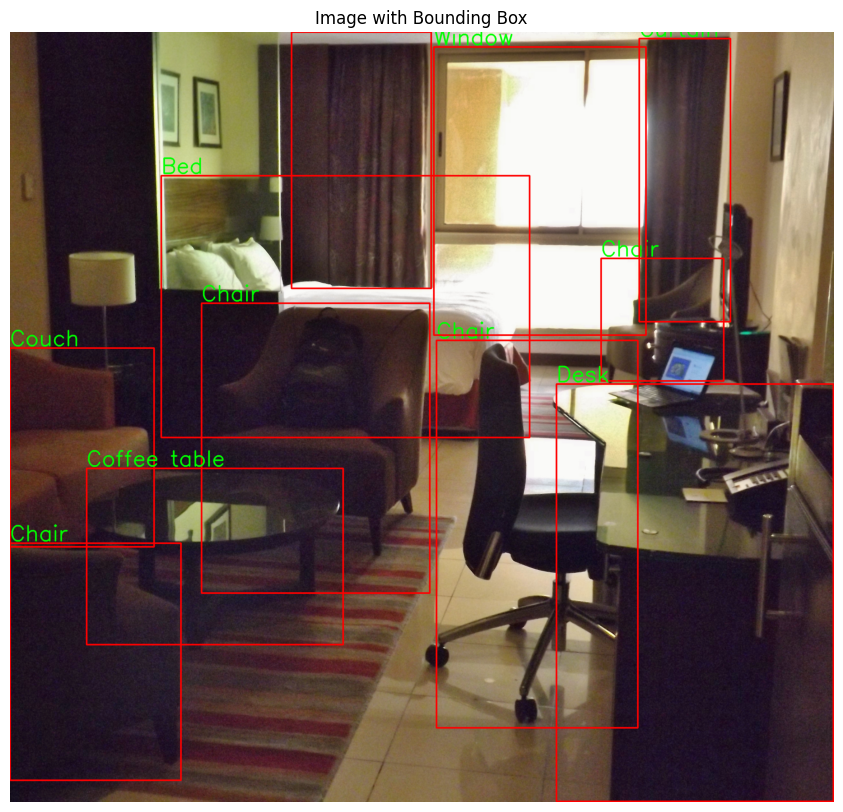

In [107]:
train_img_ids = train_df["FileName"].head().str.split(".").str[0].unique() # plotting the bounding box
for img_id in train_img_ids:
    plot_bbox(img_id)

In [108]:
val_df = pd.DataFrame(columns=['FileName', 'XMin', 'XMax', 'YMin', 'YMax', 'ClassName'])
test_df = pd.DataFrame(columns=['FileName', 'XMin', 'XMax', 'YMin', 'YMax', 'ClassName'])

# find boxes in each image and put them in a dataframe
test_imgs = os.listdir(test_path)
test_imgs = [name for name in test_imgs if not name.startswith('.')]

for i in range(len(test_imgs)):
    sys.stdout.write('Parse test_imgs ' + str(i) + '; Number of boxes: ' + str(len(test_df)) + '\r')
    sys.stdout.flush()
    img_name = test_imgs[i]
    img_id = img_name[0:16]
    tmp_df = annotations_bbox[annotations_bbox['ImageID']==img_id]
    for index, row in tmp_df.iterrows():
        labelName = row['LabelName']
        for i in range(len(label_names)):
            if labelName == label_names[i]:
                val_df = val_df.append({'FileName': img_name, 
                                            'XMin': row['XMin'], 
                                            'XMax': row['XMax'], 
                                            'YMin': row['YMin'], 
                                            'YMax': row['YMax'], 
                                            'ClassName': classes[i]}, 
                                           ignore_index=True)

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,


C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': img_name,
C:\Users\farenrai\AppData\Local\Temp\ipykernel_10232\3708880178.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  val_df = val_df.append({'FileName': im

In [109]:
train_df.to_csv('train.csv')
test_df.to_csv('test.csv')

In [110]:
#Write train.csv to annotation.txt
train_df = pd.read_csv('train.csv')
# for training
with open("annotation.txt", "w+") as f:
    for idx, row in train_df.iterrows():
        img = cv2.imread('train/' + row['FileName'])
        height, width = img.shape[:2]
        x1 = int(row['XMin'] * width)
        x2 = int(row['XMax'] * width)
        y1 = int(row['YMin'] * height)
        y2 = int(row['YMax'] * height)
      
        train_file_path = 'train'
        fileName = os.path.join(train_file_path, row['FileName'])
        className = row['ClassName']
        f.write(fileName + ',' + str(x1) + ',' + str(y1) + ',' + str(x2) + ',' + str(y2) + ',' + className + '\n')


In [111]:
test_df = pd.read_csv('test.csv')
# for test
with open("test_annotation.txt", "w+") as f:
    for idx, row in test_df.iterrows():
        sys.stdout.write(str(idx) + '\r')
        sys.stdout.flush()
        img = cv2.imread('test/' + row['FileName'])
        height, width = img.shape[:2]
        x1 = int(row['XMin'] * width)
        x2 = int(row['XMax'] * width)
        y1 = int(row['YMin'] * height)
        y2 = int(row['YMax'] * height)
      
        test_file_path = 'test'
        fileName = os.path.join(test_file_path, row['FileName'])
        className = row['ClassName']
        f.write(fileName + ',' + str(x1) + ',' + str(y1) + ',' + str(x2) + ',' + str(y2) + ',' + className + '\n')